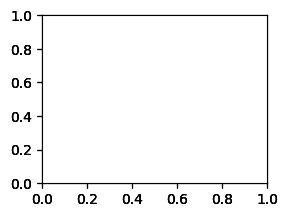

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import seaborn as sns

fig = plt.figure()
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 1)
ax3 = fig.add_subplot(2, 2, 1)


In [ ]:

df = pd.read_csv("train.csv")
df.dropna(subset = "fuel_type", inplace = True)



threshold = 0.6 * len(df)
cols_with_nulls = df.columns[df.isnull().mean() > 0.6]
df.drop(columns=cols_with_nulls, inplace=True)



In [ ]:
## unique su car brand:
car_brands = df["brand"].drop_duplicates()
print("Ci sono un totale di: " +  str(car_brands.count()) + " differenti marche di auto")
print(car_brands)

Ci sono un totale di: 57 differenti marche di auto
0                  MINI
1               Lincoln
2             Chevrolet
3               Genesis
4         Mercedes-Benz
5                  Audi
8                  Ford
9                   BMW
12             Cadillac
14                 Land
16                  GMC
18               Toyota
21              Hyundai
24                Volvo
34           Volkswagen
39                Buick
44               Rivian
45                  RAM
48               Hummer
49                 Alfa
50             INFINITI
55                 Jeep
61              Porsche
70              McLaren
74                Honda
91                Lexus
96                Dodge
98               Nissan
106              Jaguar
111               Acura
115                 Kia
136          Mitsubishi
139         Rolls-Royce
145            Maserati
151             Pontiac
154              Saturn
175             Bentley
194               Tesla
216               Mazda
238          

In [ ]:
## unique models:
car_models = df["model"].drop_duplicates()
print("Ci sono un totale di: " +  str(car_models.count()) + " differenti modelli di auto")
print(car_models)

Ci sono un totale di: 1888 differenti modelli di auto
0                    Cooper S Base
1                            LS V8
2                Silverado 2500 LT
3                 G90 5.0 Ultimate
4                      Metris Base
                    ...           
146928                      Leaf S
156882            2 Launch Edition
157319    IONIQ Plug-In Hybrid SEL
169285                bZ4X Limited
175203                 ForTwo Pure
Name: model, Length: 1888, dtype: object


In [ ]:
## unique models:
car_fuels = df["fuel_type"].drop_duplicates()
print("Ci sono un totale di: " +  str(car_fuels.count()) + " differenti modelli di carburante/energia auto")
print(car_fuels)

## E85 sarebbe un tipo di benzina/etanolo/mix dei due, quindi avrebbe senso sostituire quel tipo con gasoline (benzina)


Ci sono un totale di: 7 differenti modelli di carburante/energia auto
0             Gasoline
2        E85 Flex Fuel
17              Hybrid
26              Diesel
116     Plug-In Hybrid
532                  –
4823     not supported
Name: fuel_type, dtype: object


<NumpyExtensionArray>
[      'Gasoline',  'E85 Flex Fuel',         'Hybrid',         'Diesel',
 'Plug-In Hybrid',              '–',  'not supported']
Length: 7, dtype: object
Tipo di energia/combustibile usato: Gasoline
Trovato in quantità: 165940
Tipo di energia/combustibile usato: E85 Flex Fuel
Trovato in quantità: 5406
Tipo di energia/combustibile usato: Hybrid
Trovato in quantità: 6832
Tipo di energia/combustibile usato: Diesel
Trovato in quantità: 3955
Tipo di energia/combustibile usato: Plug-In Hybrid
Trovato in quantità: 521
Tipo di energia/combustibile usato: –
Trovato in quantità: 781
Tipo di energia/combustibile usato: not supported
Trovato in quantità: 15
[np.int64(165940), np.int64(5406), np.int64(6832), np.int64(3955), np.int64(521), np.int64(781), np.int64(15)]


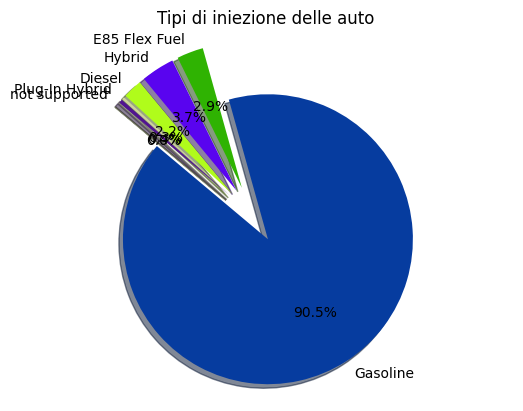

In [ ]:
## visualizzazione dei tipi di iniezione delle auto
print(car_fuels.array)

labels = car_fuels.array
##labels = np.delete(labels, 0)


sizes = []
colors = []
for fuel in labels:
    print("Tipo di energia/combustibile usato: " + str(fuel))
    df_fuel = df[df["fuel_type"] == fuel]
    ## seleziona dal df solo quando colonna == fuel
    ##print(df_fuel)
    quantita = df_fuel["fuel_type"].count()
    print("Trovato in quantità: " + str(quantita))

    r = random.random() 
    b = random.random() 
    g = random.random() 
  
    color = (r, g, b)

    sizes.append(quantita)
    colors.append(color)
    
print(sizes)

## colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'silver', 'steelblue', 'crimson']
## explode = (0.1, 0, 0, 0, 0, 0, 0)

explode = np.full(len(labels), 0.2)

plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title("Tipi di iniezione delle auto")
plt.axis('equal') 
plt.show()

<NumpyExtensionArray>
[      'Gasoline',  'E85 Flex Fuel',         'Hybrid',         'Diesel',
 'Plug-In Hybrid',              '–',  'not supported']
Length: 7, dtype: object
Tipo di energia/combustibile usato: E85 Flex Fuel
Trovato in quantità: 5406
Tipo di energia/combustibile usato: Hybrid
Trovato in quantità: 6832
Tipo di energia/combustibile usato: Diesel
Trovato in quantità: 3955
Tipo di energia/combustibile usato: Plug-In Hybrid
Trovato in quantità: 521
Tipo di energia/combustibile usato: –
Trovato in quantità: 781
Tipo di energia/combustibile usato: not supported
Trovato in quantità: 15
[np.int64(5406), np.int64(6832), np.int64(3955), np.int64(521), np.int64(781), np.int64(15)]


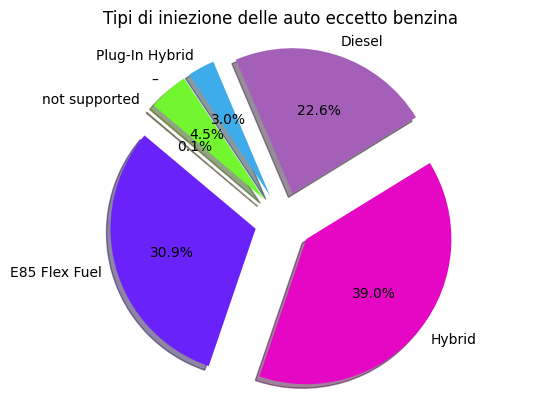

In [ ]:
## visualizzazione dei tipi di iniezione delle auto (ECCETTO BENZINA GASOLINE)
print(car_fuels.array)

labels = car_fuels.array

## qui tolgo benzina (gasoline)
labels = np.delete(labels, 0)


sizes = []
colors = []
for fuel in labels:
    print("Tipo di energia/combustibile usato: " + str(fuel))
    df_fuel = df[df["fuel_type"] == fuel]
    ## seleziona dal df solo quando colonna == fuel
    ##print(df_fuel)
    quantita = df_fuel["fuel_type"].count()
    print("Trovato in quantità: " + str(quantita))

    r = random.random() 
    b = random.random() 
    g = random.random() 
  
    color = (r, g, b)

    sizes.append(quantita)
    colors.append(color)
    
print(sizes)

## colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'silver', 'steelblue', 'crimson']
## explode = (0.1, 0, 0, 0, 0, 0, 0)

explode = np.full(len(labels), 0.2)

plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title("Tipi di iniezione delle auto eccetto benzina")
plt.axis('equal') 
plt.show()

In [ ]:
## unique transmissions:
car_transmissions = df["transmission"].drop_duplicates()
print("Ci sono un totale di: " +  str(car_transmissions.count()) + " differenti modelli di trasmissioni auto")
print(car_transmissions)

Ci sono un totale di: 52 differenti modelli di trasmissioni auto
0                                                      A/T
3                           Transmission w/Dual Shift Mode
4                                              7-Speed A/T
6                                              8-Speed A/T
8                                       10-Speed Automatic
12                                             6-Speed A/T
16                                            10-Speed A/T
19                                             9-Speed A/T
20                                       8-Speed Automatic
39                                       9-Speed Automatic
40                                             5-Speed A/T
70                       7-Speed Automatic with Auto-Shift
72                                               Automatic
74                                        CVT Transmission
81                                             5-Speed M/T
88                                                

In [ ]:
df_brand = df['brand'].unique()
len(df_brand),df_brand


(57,
 array(['MINI', 'Lincoln', 'Chevrolet', 'Genesis', 'Mercedes-Benz', 'Audi',
        'Ford', 'BMW', 'Cadillac', 'Land', 'GMC', 'Toyota', 'Hyundai',
        'Volvo', 'Volkswagen', 'Buick', 'Rivian', 'RAM', 'Hummer', 'Alfa',
        'INFINITI', 'Jeep', 'Porsche', 'McLaren', 'Honda', 'Lexus',
        'Dodge', 'Nissan', 'Jaguar', 'Acura', 'Kia', 'Mitsubishi',
        'Rolls-Royce', 'Maserati', 'Pontiac', 'Saturn', 'Bentley', 'Tesla',
        'Mazda', 'Subaru', 'Ferrari', 'Aston', 'Lamborghini', 'Chrysler',
        'Lucid', 'Lotus', 'Scion', 'Plymouth', 'Suzuki', 'FIAT', 'Saab',
        'Bugatti', 'Mercury', 'Karma', 'Maybach', 'smart', 'Polestar'],
       dtype=object))

<NumpyExtensionArray>
[         'MINI',       'Lincoln',     'Chevrolet',       'Genesis',
 'Mercedes-Benz',          'Audi',          'Ford',           'BMW',
      'Cadillac',          'Land',           'GMC',        'Toyota',
       'Hyundai',         'Volvo',    'Volkswagen',         'Buick',
        'Rivian',           'RAM',        'Hummer',          'Alfa',
      'INFINITI',          'Jeep',       'Porsche',       'McLaren',
         'Honda',         'Lexus',         'Dodge',        'Nissan',
        'Jaguar',         'Acura',           'Kia',    'Mitsubishi',
   'Rolls-Royce',      'Maserati',       'Pontiac',        'Saturn',
       'Bentley',         'Tesla',         'Mazda',        'Subaru',
       'Ferrari',         'Aston',   'Lamborghini',      'Chrysler',
         'Lucid',         'Lotus',         'Scion',      'Plymouth',
        'Suzuki',          'FIAT',          'Saab',       'Bugatti',
       'Mercury',         'Karma',       'Maybach',         'smart',
      'Poles

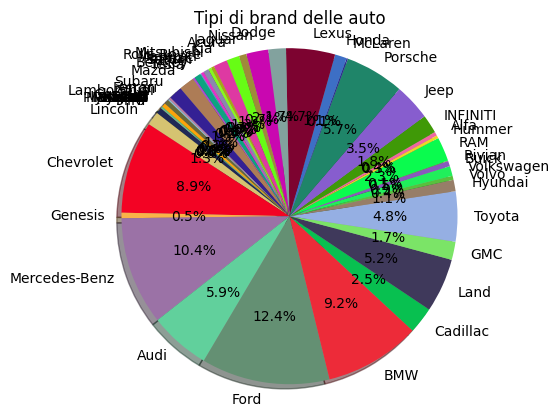

In [ ]:
## visualizzazione dei tipi di brand delle auto
print(car_brands.array)

labels = car_brands.array
sizes = []
colors = []
for brand in car_brands.array:
    print("Tipo di brand: " + str(brand))
    df_brand = df[df["brand"] == brand]
    ## seleziona dal df solo quando colonna == brand
    ##print(df_fuel)
    quantita = df_brand["brand"].count()
    print("Trovato in quantità: " + str(quantita))

    r = random.random() 
    b = random.random() 
    g = random.random() 
  
    color = (r, g, b)

    sizes.append(quantita)
    colors.append(color)
    
print(sizes)

explode = np.full(len(labels), 0)


plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title("Tipi di brand delle auto")
plt.axis('equal') 
plt.show()

<NumpyExtensionArray>
[         'MINI',       'Lincoln',     'Chevrolet',       'Genesis',
 'Mercedes-Benz',          'Audi',          'Ford',           'BMW',
      'Cadillac',          'Land',           'GMC',        'Toyota',
       'Hyundai',         'Volvo',    'Volkswagen',         'Buick',
        'Rivian',           'RAM',        'Hummer',          'Alfa',
      'INFINITI',          'Jeep',       'Porsche',       'McLaren',
         'Honda',         'Lexus',         'Dodge',        'Nissan',
        'Jaguar',         'Acura',           'Kia',    'Mitsubishi',
   'Rolls-Royce',      'Maserati',       'Pontiac',        'Saturn',
       'Bentley',         'Tesla',         'Mazda',        'Subaru',
       'Ferrari',         'Aston',   'Lamborghini',      'Chrysler',
         'Lucid',         'Lotus',         'Scion',      'Plymouth',
        'Suzuki',          'FIAT',          'Saab',       'Bugatti',
       'Mercury',         'Karma',       'Maybach',         'smart',
      'Poles

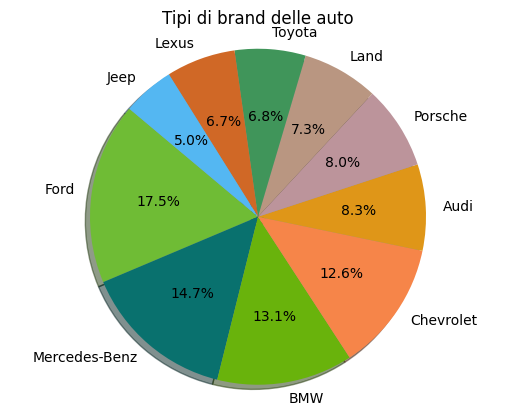

In [ ]:
## visualizzazione dei tipi di brand delle auto   TOP 10
print(car_brands.array)

labels = car_brands.array
sizes = []
colors = []

for indice in range(0, 10):

    r = random.random() 
    b = random.random() 
    g = random.random() 
  
    color = (r, g, b)


    colors.append(color)


for brand in car_brands.array:
    print("Tipo di brand: " + str(brand))
    df_brand = df[df["brand"] == brand]
    ## seleziona dal df solo quando colonna == brand
    ##print(df_fuel)
    quantita = df_brand["brand"].count()
    print("Trovato in quantità: " + str(quantita))

    sizes.append(quantita)
    
print(sizes)


lista = zip(sizes, labels)
lista = sorted(lista, reverse = True)
lista = lista[0 : 10]

sizes, labels = zip(*lista)

explode = np.full(len(labels), 0)


plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title("Tipi di brand delle auto")
plt.axis('equal') 
plt.show()

<NumpyExtensionArray>
[         'MINI',       'Lincoln',     'Chevrolet',       'Genesis',
 'Mercedes-Benz',          'Audi',          'Ford',           'BMW',
      'Cadillac',          'Land',           'GMC',        'Toyota',
       'Hyundai',         'Volvo',    'Volkswagen',         'Buick',
        'Rivian',           'RAM',        'Hummer',          'Alfa',
      'INFINITI',          'Jeep',       'Porsche',       'McLaren',
         'Honda',         'Lexus',         'Dodge',        'Nissan',
        'Jaguar',         'Acura',           'Kia',    'Mitsubishi',
   'Rolls-Royce',      'Maserati',       'Pontiac',        'Saturn',
       'Bentley',         'Tesla',         'Mazda',        'Subaru',
       'Ferrari',         'Aston',   'Lamborghini',      'Chrysler',
         'Lucid',         'Lotus',         'Scion',      'Plymouth',
        'Suzuki',          'FIAT',          'Saab',       'Bugatti',
       'Mercury',         'Karma',       'Maybach',         'smart',
      'Poles

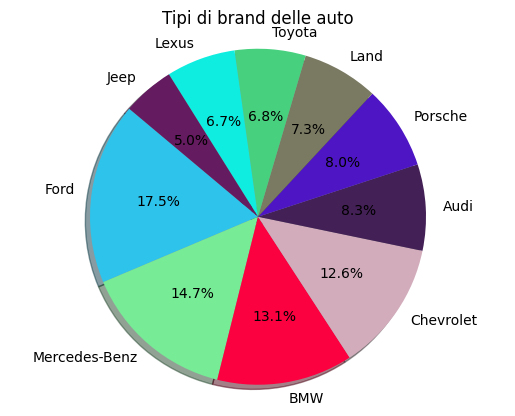

In [ ]:
## visualizzazione dei tipi di brand delle auto   TOP 10
print(car_brands.array)

labels = car_brands.array
sizes = []
colors = []

for indice in range(0, 10):

    r = random.random() 
    b = random.random() 
    g = random.random() 
  
    color = (r, g, b)


    colors.append(color)


for brand in car_brands.array:
    print("Tipo di brand: " + str(brand))
    df_brand = df[df["brand"] == brand]
    ## seleziona dal df solo quando colonna == brand
    ##print(df_fuel)
    quantita = df_brand["brand"].count()
    print("Trovato in quantità: " + str(quantita))

    sizes.append(quantita)
    
print(sizes)


lista = zip(sizes, labels)
lista = sorted(lista, reverse = True)
lista = lista[0 : 10]

sizes, labels = zip(*lista)

explode = np.full(len(labels), 0)


plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title("Tipi di brand delle auto")
plt.axis('equal') 
plt.show()

In [ ]:
## top 10 veicoli più costosi:
top_10_car_models = df.sort_values(by = "price", ascending = False)
top_10_car_models = top_10_car_models.head(10)
print(top_10_car_models)




top_10_car_models_brands = df["brand"].array
top_10_car_models_models = df["model"].array


print(top_10_car_models_brands)
print(top_10_car_models_models)



            id          brand                       model  model_year  milage  \
79469    79469          Aston  Martin DB7 Vantage Volante        2005   89900   
220        220           Ford                   F-150 XLT        2021   26315   
92612    92612          Lexus                 ES 350 Base        2008  132252   
79269    79269           Ford       Expedition Timberline        2021    7758   
181021  181021       Cadillac                DeVille Base        1994   85200   
151415  151415           Ford          Thunderbird Deluxe        2008   95170   
72448    72448  Mercedes-Benz     SL-Class SL550 Roadster        2001  113500   
55428    55428          Lexus                 LS 430 Base        2004   39750   
1880      1880       Chrysler                   300C Base        2003   55900   
59650    59650         Toyota              Highlander XLE        2022   13566   

       fuel_type                                         engine  \
79469   Gasoline  420.0HP 5.9L 12 Cylinde

['MINI Cooper S Base', 'Lincoln LS V8', 'Chevrolet Silverado 2500 LT', 'Genesis G90 5.0 Ultimate', 'Mercedes-Benz Metris Base', 'Audi A6 2.0T Sport', 'Audi A8 L 3.0T', 'Chevrolet Silverado 1500 1LZ', 'Ford F-150 XLT', 'BMW M4 Base', 'Chevrolet Camaro 1LT', 'Cadillac Escalade ESV Platinum', 'Audi S4 3.0T Premium Plus', 'Land Rover Range Rover P530 SE SWB', 'Mercedes-Benz AMG C 63 S', 'GMC Yukon Denali', 'Land Rover Defender SE', 'Toyota Tundra SR5', 'Mercedes-Benz AMG C 63 Base', 'Land Rover Defender S', 'Hyundai Equus Signature', 'Ford Mustang Premium', 'Audi A8 L 55', 'Volvo XC70 T6 Platinum', 'Toyota Sequoia Limited', 'Ford F-250 XLT', 'Genesis G90 5.0 Ultimate', 'Toyota Tacoma PreRunner', 'Audi A5 2.0T Premium', 'Audi A3 2.0T Premium', 'Mercedes-Benz E-Class E 300', 'Mercedes-Benz E-Class E 350 4MATIC', 'Volkswagen Jetta S', 'BMW 528 i xDrive', 'BMW 330 i xDrive', 'Mercedes-Benz AMG G 63 Base', 'Mercedes-Benz C-Class C 300 4MATIC Sport', 'Buick Enclave Premium', 'BMW 328 xi', 'Ford 

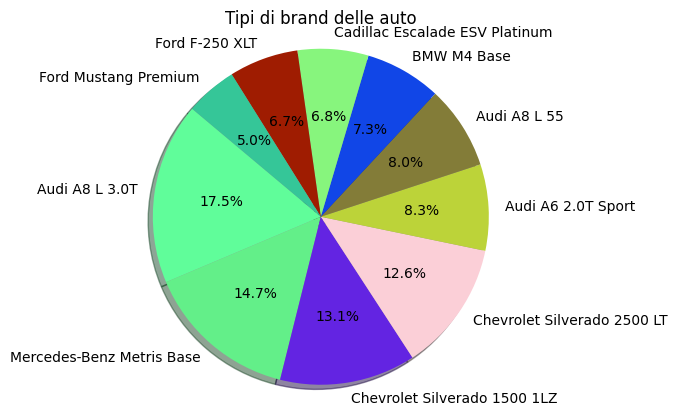

In [ ]:
## visualizzazione dei TOP 10 veicoli più costosi
## print(top_10_car_models)




labels = []

for i in range(0, len(top_10_car_models_brands)):
    labels.append(top_10_car_models_brands[i] + " " + top_10_car_models_models[i])

print(labels)



print(labels)
sizes = []
colors = []

for indice in range(0, 10):

    r = random.random() 
    b = random.random() 
    g = random.random() 
  
    color = (r, g, b)


    colors.append(color)


for brand in car_brands.array:
    print("Tipo di brand: " + str(brand))
    df_brand = df[df["brand"] == brand]
    ## seleziona dal df solo quando colonna == brand
    ##print(df_fuel)
    quantita = df_brand["brand"].count()
    print("Trovato in quantità: " + str(quantita))

    sizes.append(quantita)
    
print(sizes)


lista = zip(sizes, labels)
lista = sorted(lista, reverse = True)
lista = lista[0 : 10]

sizes, labels = zip(*lista)

explode = np.full(len(labels), 0)


plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title("Tipi di brand delle auto")
plt.axis('equal') 
plt.show()

In [ ]:
## per ogni correlazione superiore a 0.25 fai grafici
## qui mi faccio la funzione parametrica per fare i grafici



def percentili_scaglioni(df, colonna1, colonna2):
    
    # Trova min e max di colonna 1
    min_col1 = np.min(df[colonna1])
    max_col1= np.max(df[colonna1])
    mean_col1 = np.mean(df[colonna1])
    print("Minimo di " + colonna1 + " " + str(min_col1))
    print("Massimo di " + colonna1 + " " + str(max_col1))
    print("Mean di " + colonna1 + " " + str(mean_col1))

    # Trova min e max di colonna 2
    min_col2 = np.min(df[colonna2])
    max_col2= np.max(df[colonna2])
    mean_col2 = np.mean(df[colonna2])
    print("Minimo di " + colonna2 + " " + str(min_col2))
    print("Massimo di " + colonna2 + " " + str(max_col2))
    print("Mean di " + colonna2 + " " + str(mean_col2))


    percent_col1 = df[colonna1].quantile(q=0.99)
    print("Percentile di " + colonna1 + " " + str(percent_col1))
    df[str(colonna1) + " group"] = pd.cut(df[colonna1], bins=range(min_col1, int(round(max_col1)), int(round(max_col1/20.0))), right=False)

    percent_col2 = df[colonna2].quantile(q=0.99)
    print("Percentile di " + colonna2 + " " + str(percent_col2))
    df[str(colonna2) + " group"] = pd.cut(df[colonna2], bins=range(min_col2, int(round(max_col2)), int(round(max_col2/20.0))), right=False)



    ## il dataframe ha come valore una tupla che contiene scaglioni della colonna1 e il valore di riferimento
    combina_col_1_2 = df.groupby(str(colonna1) + " group").agg(
    min_combined = (colonna2, 'min'),
    max_combined = (colonna2, 'max'),
    mean_combined = (colonna2, 'mean'),
    Count = (colonna2, 'size')
    )

    # print(combina_col_1_2["min_combined"])
    # print(type(combina_col_1_2["min_combined"]))

    # print(combina_col_1_2["min_combined"])
    # print(type(combina_col_1_2["min_combined"]))
    # print(type(df["price"]))

    return pd.DataFrame(combina_col_1_2)


percentili_scaglioni(df, "milage", "price")



Minimo di milage 100
Massimo di milage 405000
Mean di milage 66689.03925865359
Minimo di price 2000
Massimo di price 2954083
Mean di price 43408.51832651949
Percentile di milage 201509.0
Percentile di price 259500.0
milage group
[100, 20350)        2000.0
[20350, 40600)      2300.0
[40600, 60850)      2000.0
[60850, 81100)      2000.0
[81100, 101350)     2000.0
[101350, 121600)    2000.0
[121600, 141850)    2000.0
[141850, 162100)    2000.0
[162100, 182350)    2000.0
[182350, 202600)    2000.0
[202600, 222850)    2000.0
[222850, 243100)    2300.0
[243100, 263350)    2300.0
[263350, 283600)    2500.0
[283600, 303850)    3200.0
[303850, 324100)    3950.0
[324100, 344350)    4500.0
[344350, 364600)    8000.0
[364600, 384850)       NaN
Name: min_combined, dtype: float64
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>


C:\Users\Rasty\AppData\Local\Temp\ipykernel_92000\2387017929.py:36: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  combina_col_1_2 = df.groupby(str(colonna1) + " group").agg(


,min_combined,max_combined,mean_combined,Count
milage group,,,,
"[100, 20350)",2000.0,2954083.0,83692.387205,38295
"[20350, 40600)",2300.0,2954083.0,57015.259353,28814
"[40600, 60850)",2000.0,2954083.0,40548.667476,27604
"[60850, 81100)",2000.0,2954083.0,32111.299729,26891
"[81100, 101350)",2000.0,2954083.0,23907.523236,20507
"[101350, 121600)",2000.0,2954083.0,18483.277589,13538
"[121600, 141850)",2000.0,2954083.0,15538.232654,11141
"[141850, 162100)",2000.0,599995.0,13542.807722,7900
"[162100, 182350)",2000.0,199991.0,12284.929832,4589


Minimo di milage 100
Massimo di milage 405000
Mean di milage 66689.03925865359
Minimo di price 2000
Massimo di price 2954083
Mean di price 43408.51832651949
Percentile di milage 201509.0
Percentile di price 259500.0
milage group
[100, 20350)        2000.0
[20350, 40600)      2300.0
[40600, 60850)      2000.0
[60850, 81100)      2000.0
[81100, 101350)     2000.0
[101350, 121600)    2000.0
[121600, 141850)    2000.0
[141850, 162100)    2000.0
[162100, 182350)    2000.0
[182350, 202600)    2000.0
[202600, 222850)    2000.0
[222850, 243100)    2300.0
[243100, 263350)    2300.0
[263350, 283600)    2500.0
[283600, 303850)    3200.0
[303850, 324100)    3950.0
[324100, 344350)    4500.0
[344350, 364600)    8000.0
[364600, 384850)       NaN
Name: min_combined, dtype: float64
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>


C:\Users\Rasty\AppData\Local\Temp\ipykernel_92000\2387017929.py:36: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  combina_col_1_2 = df.groupby(str(colonna1) + " group").agg(


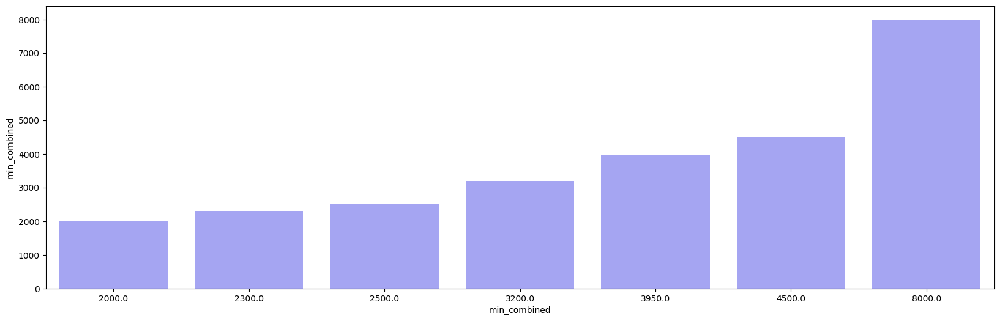

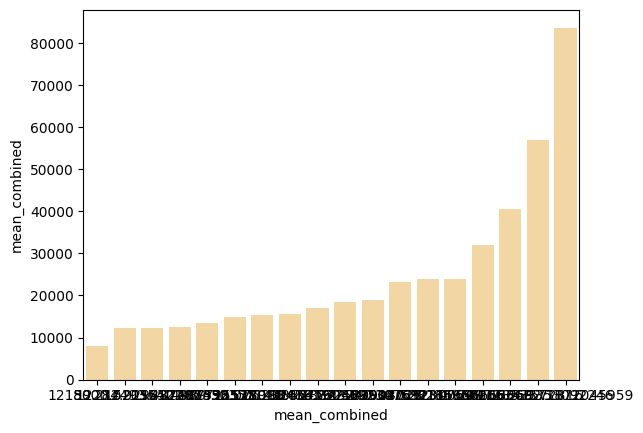

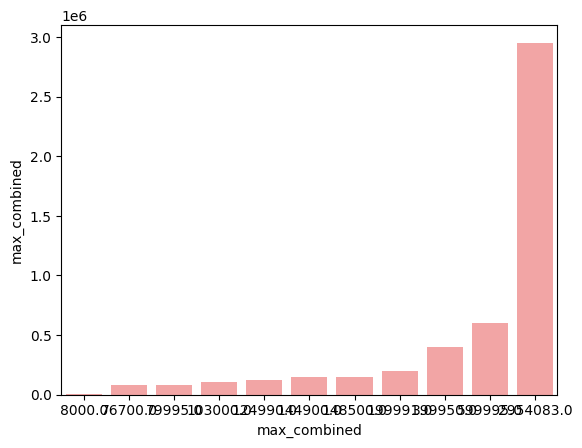

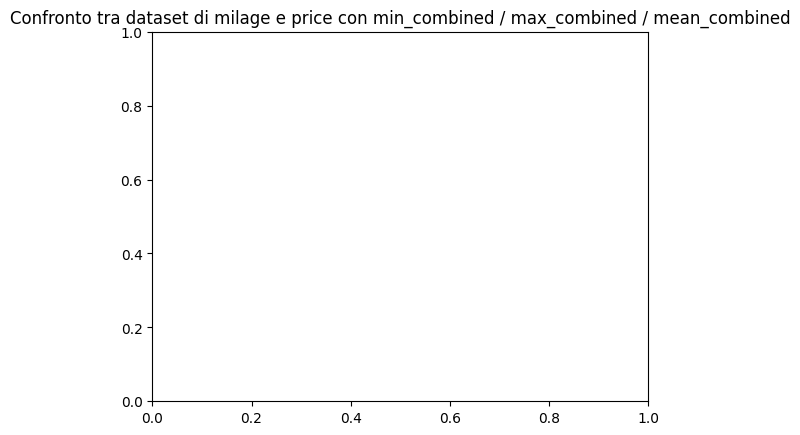

In [ ]:

## i parametri possono essere: min_combined / max_combined / mean_combined

def illustra_barplot_combinato(dataframe, colonna1, colonna2):

    # mean_price_per_year = df.groupby('model_year')['price'].mean().reset_index()

    # mean_price_per_year_clean = df[df['accident']=='None reported'].groupby('model_year')['price'].mean().reset_index()


    dataframe_combinato = percentili_scaglioni(dataframe, "milage", "price")

    print(type(dataframe_combinato))
    print(type(dataframe_combinato["min_combined"]))

    


    plt.figure(figsize=(20, 6))
    sns.barplot(x = "min_combined", y = "min_combined", data = dataframe_combinato, color = "blue", alpha=0.4)
    plt.show()
    sns.barplot(x = "mean_combined", y = "mean_combined", data = dataframe_combinato, color = "orange", alpha=0.4)
    plt.show()
    sns.barplot(x = "max_combined", y = "max_combined", data = dataframe_combinato, color = "red", alpha=0.4)
    plt.show()

illustra_barplot_combinato(df, "milage", "price")


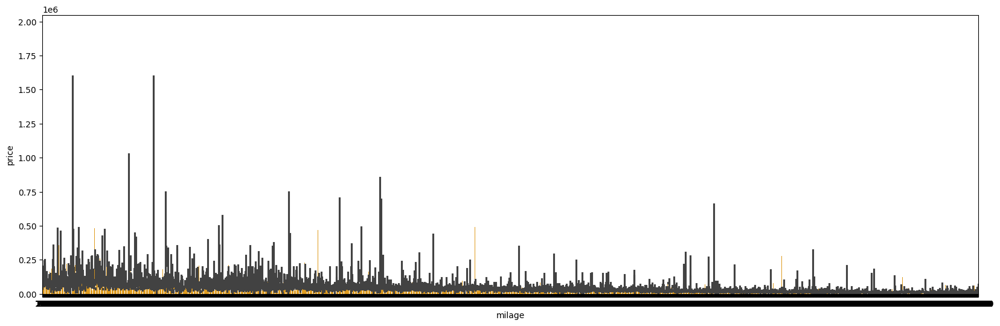

In [ ]:
## i parametri possono essere: min_combined / max_combined / mean_combined

def illustra_barplot(dataframe, colonna1, colonna2, fig_x, fig_y):

    plt.figure(figsize=( fig_x, fig_y))
    sns.barplot(x = colonna1, y = colonna2, data = dataframe, color = "orange")
    plt.show()


illustra_barplot(df, "milage", "price", 20, 6)